In [1]:
import mtcnn
from os import listdir
from os.path import isdir
from PIL import Image
from matplotlib import pyplot
from numpy import savez_compressed, asarray, load
from mtcnn.mtcnn import MTCNN
from keras.models import load_model
from sklearn.preprocessing import LabelEncoder, Normalizer
from numpy import linalg as la
from matplotlib import pyplot
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from random import choice
from numpy import load
from numpy import expand_dims
import os
import numpy as np
import matplotlib.pyplot as plt
import joblib

# Load model

path_to_model = "facenet_keras.h5"
model = load_model(path_to_model)

Using TensorFlow backend.
C:\ProgramData\Anaconda3\envs\tensorflow\lib\site-packages\keras\engine\saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Predicted: Hillary_Clinton (16.415)
Expected: Hillary_Clinton


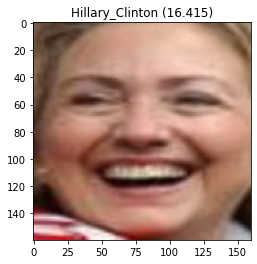

In [2]:
from random import choice
from numpy import load
from numpy import expand_dims
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
from sklearn.svm import SVC
from matplotlib import pyplot


# load faces
data = load('custom_lfw.npz')
testX_faces = data['arr_2']

# load face embeddings
data = load('custom_lfw_embeddings.npz')
trainX, trainy, testX, testy = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']

# normalize input vectors
in_encoder = Normalizer(norm='l2')
trainX = in_encoder.transform(trainX)
testX = in_encoder.transform(testX)

# label encode targets
out_encoder = LabelEncoder()
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
testy = out_encoder.transform(testy)

# fit model
model = SVC(kernel='linear', probability=True, random_state=0)
model.fit(trainX, trainy)

# save the model to disk
filename = 'svc2.sav'
joblib.dump(model, filename)

# test model on a random example from the test dataset
selection = choice([i for i in range(testX.shape[0])])
random_face_pixels = testX_faces[selection]
random_face_emb = testX[selection]
random_face_class = testy[selection]
random_face_name = out_encoder.inverse_transform([random_face_class])

# prediction for the face
samples = expand_dims(random_face_emb, axis=0)
yhat_class = model.predict(samples)
yhat_prob = model.predict_proba(samples)

# get name
class_index = yhat_class[0]
class_probability = yhat_prob[0,class_index] * 100
predict_names = out_encoder.inverse_transform(yhat_class)
print('Predicted: %s (%.3f)' % (predict_names[0], class_probability))
print('Expected: %s' % random_face_name[0])

# plot for fun
pyplot.imshow(random_face_pixels)
title = '%s (%.3f)' % (predict_names[0], class_probability)
pyplot.title(title)
pyplot.show()

Predicted: Mark_Philippoussis (13.579)
Expected: Mark_Philippoussis


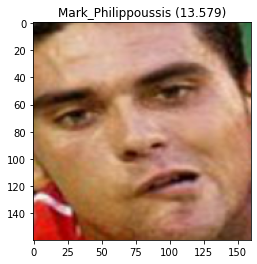

Predicted: Mark_Philippoussis (9.323)
Expected: Mark_Philippoussis


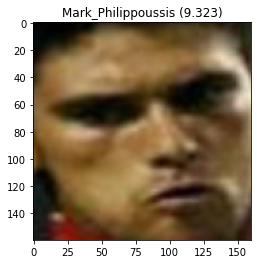

Predicted: Mark_Philippoussis (9.339)
Expected: Mark_Philippoussis


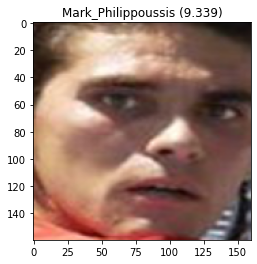

Predicted: Heizo_Takenaka (7.953)
Expected: Heizo_Takenaka


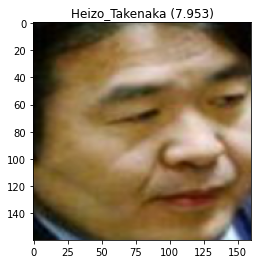

Predicted: Heizo_Takenaka (12.585)
Expected: Heizo_Takenaka


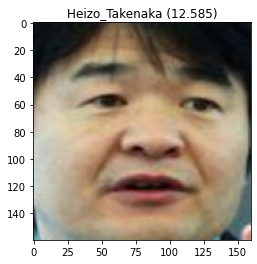

Predicted: Zhu_Rongji (11.869)
Expected: Zhu_Rongji


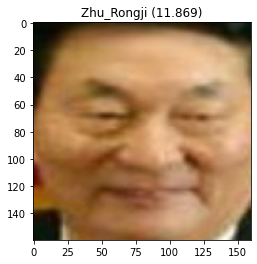

Predicted: Zhu_Rongji (13.073)
Expected: Zhu_Rongji


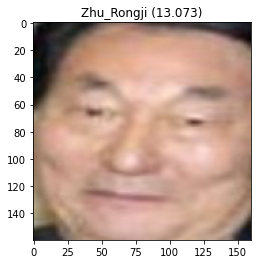

Predicted: Fidel_Castro (21.077)
Expected: Fidel_Castro


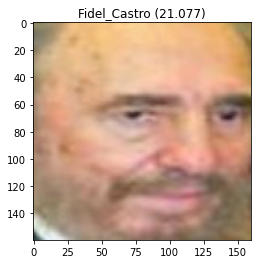

Predicted: Fidel_Castro (23.449)
Expected: Fidel_Castro


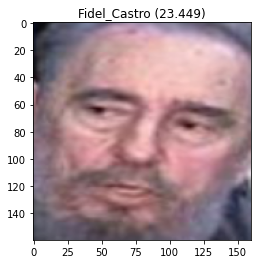

Predicted: Fidel_Castro (16.844)
Expected: Fidel_Castro


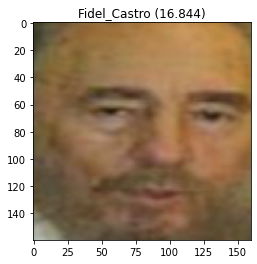

Predicted: Fidel_Castro (16.854)
Expected: Fidel_Castro


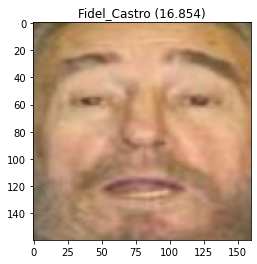

Predicted: Paul_ONeill (12.745)
Expected: Paul_ONeill


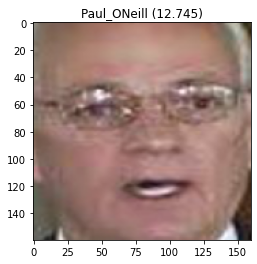

Predicted: Paul_ONeill (10.709)
Expected: Paul_ONeill


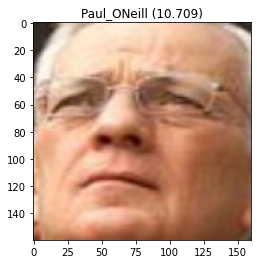

Predicted: Harrison_Ford (18.803)
Expected: Harrison_Ford


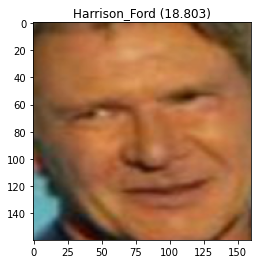

Predicted: Harrison_Ford (16.291)
Expected: Harrison_Ford


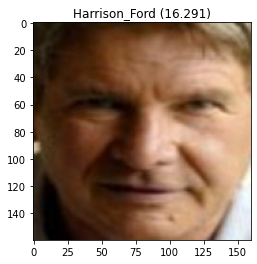

Predicted: Harrison_Ford (16.281)
Expected: Harrison_Ford


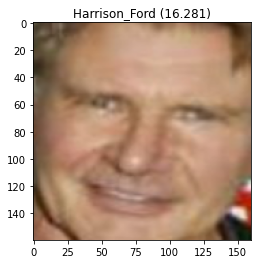

Predicted: James_Blake (14.558)
Expected: James_Blake


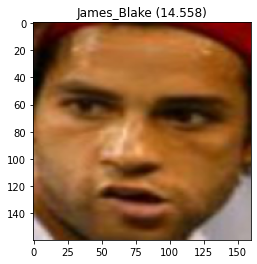

Predicted: James_Blake (15.525)
Expected: James_Blake


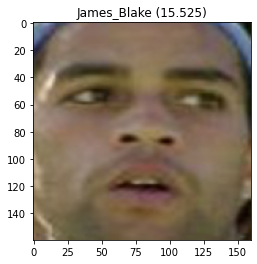

Predicted: James_Blake (8.201)
Expected: James_Blake


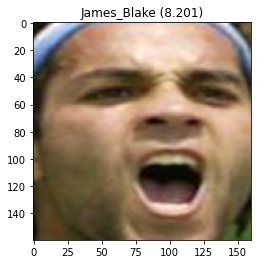

Predicted: Ari_Fleischer (12.061)
Expected: Ari_Fleischer


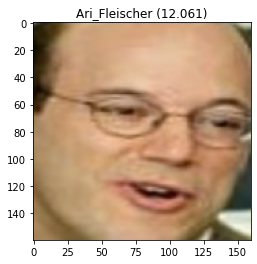

Predicted: Ari_Fleischer (16.985)
Expected: Ari_Fleischer


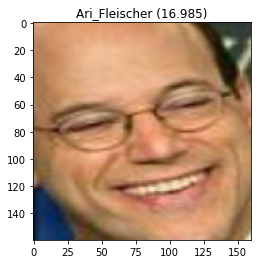

Predicted: Ari_Fleischer (17.787)
Expected: Ari_Fleischer


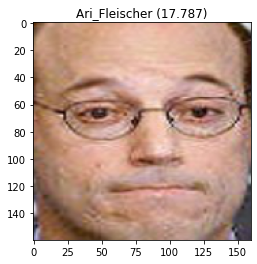

Predicted: Michael_Jackson (19.496)
Expected: Michael_Jackson


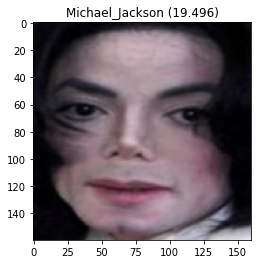

Predicted: Michael_Jackson (15.733)
Expected: Michael_Jackson


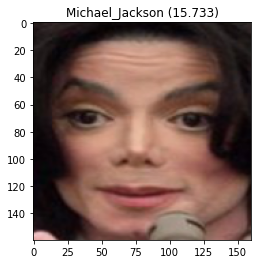

Predicted: Michael_Jackson (17.386)
Expected: Michael_Jackson


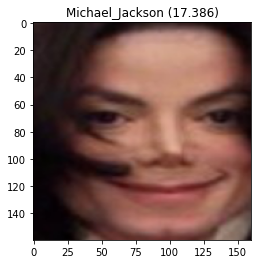

Predicted: Tom_Hanks (10.671)
Expected: Tom_Hanks


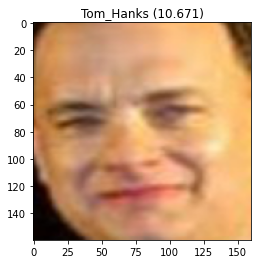

Predicted: Tom_Hanks (15.832)
Expected: Tom_Hanks


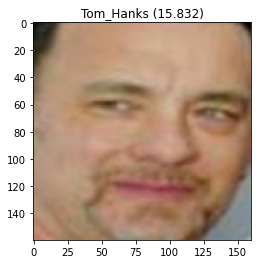

Predicted: George_HW_Bush (18.764)
Expected: George_HW_Bush


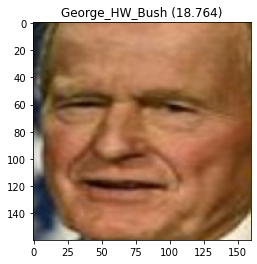

Predicted: George_HW_Bush (18.927)
Expected: George_HW_Bush


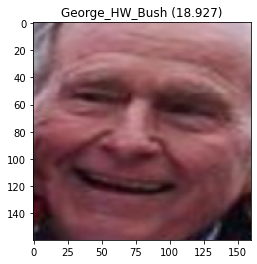

Predicted: George_HW_Bush (16.578)
Expected: George_HW_Bush


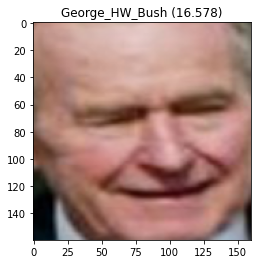

Predicted: Britney_Spears (19.579)
Expected: Britney_Spears


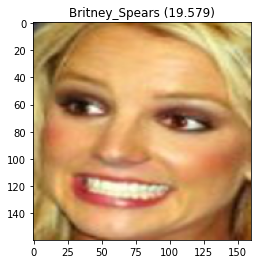

Predicted: Britney_Spears (17.885)
Expected: Britney_Spears


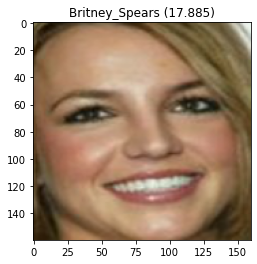

Predicted: Britney_Spears (18.669)
Expected: Britney_Spears


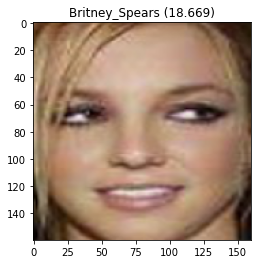

Predicted: Sylvester_Stallone (12.669)
Expected: Sylvester_Stallone


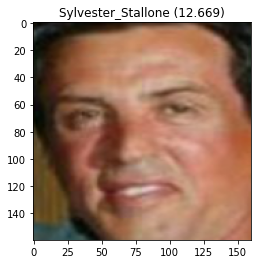

Predicted: Sylvester_Stallone (14.874)
Expected: Sylvester_Stallone


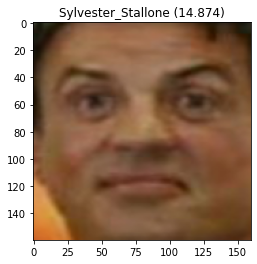

Predicted: James_Kelly (9.786)
Expected: James_Kelly


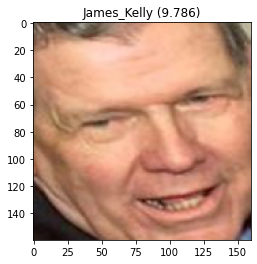

Predicted: James_Kelly (10.575)
Expected: James_Kelly


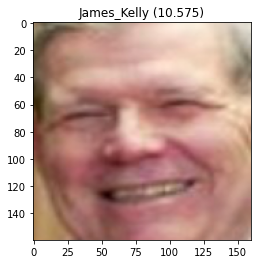

Predicted: James_Kelly (12.313)
Expected: James_Kelly


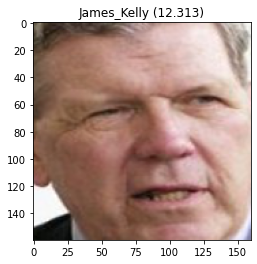

Predicted: John_Allen_Muhammad (12.947)
Expected: John_Allen_Muhammad


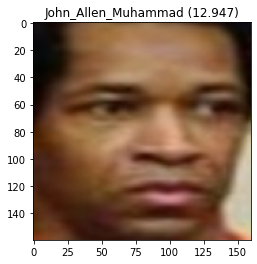

Predicted: John_Allen_Muhammad (11.301)
Expected: John_Allen_Muhammad


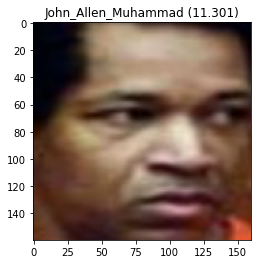

Predicted: John_Allen_Muhammad (13.744)
Expected: John_Allen_Muhammad


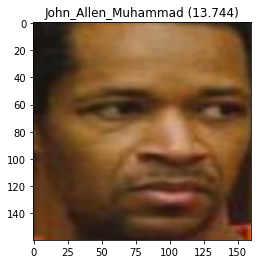

Predicted: Norah_Jones (12.896)
Expected: Norah_Jones


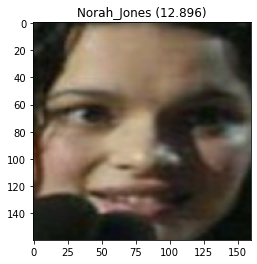

Predicted: Norah_Jones (15.621)
Expected: Norah_Jones


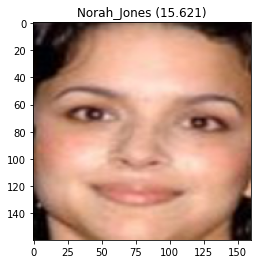

Predicted: Norah_Jones (12.990)
Expected: Norah_Jones


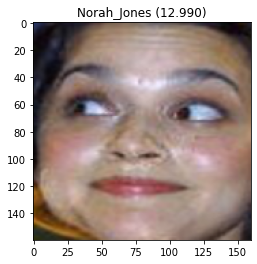

Predicted: Condoleezza_Rice (13.321)
Expected: Condoleezza_Rice


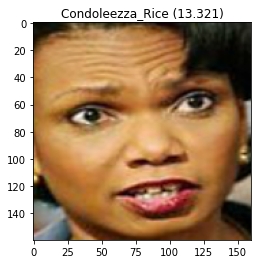

Predicted: Condoleezza_Rice (12.332)
Expected: Condoleezza_Rice


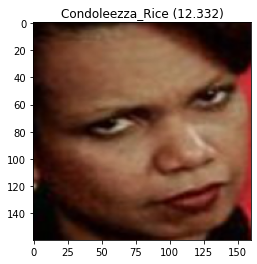

Predicted: Condoleezza_Rice (13.435)
Expected: Condoleezza_Rice


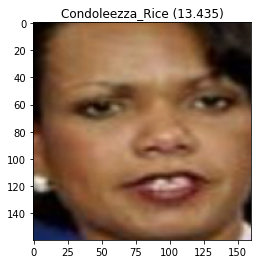

Predicted: Tang_Jiaxuan (13.656)
Expected: Tang_Jiaxuan


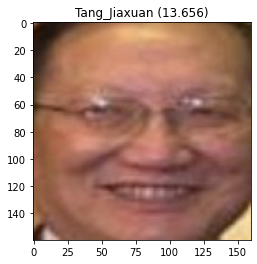

Predicted: Tang_Jiaxuan (12.478)
Expected: Tang_Jiaxuan


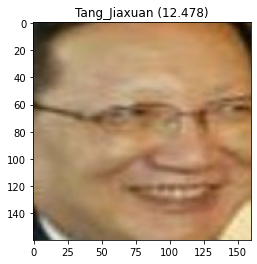

Predicted: Tang_Jiaxuan (11.483)
Expected: Tang_Jiaxuan


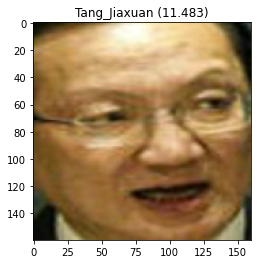

Predicted: Anna_Kournikova (7.550)
Expected: Anna_Kournikova


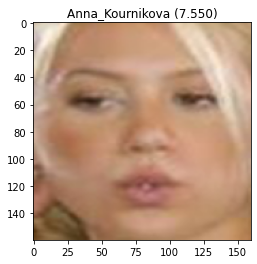

Predicted: Anna_Kournikova (11.726)
Expected: Anna_Kournikova


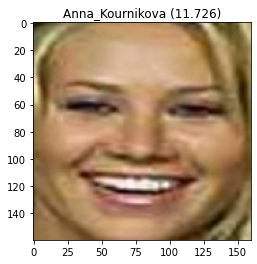

Predicted: Anna_Kournikova (18.426)
Expected: Anna_Kournikova


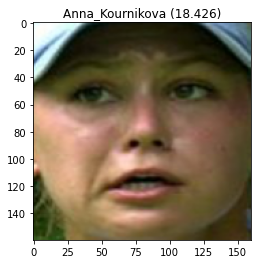

Predicted: Wen_Jiabao (19.979)
Expected: Wen_Jiabao


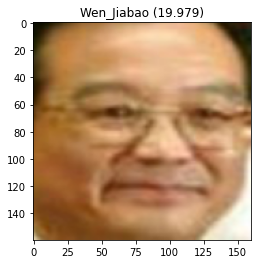

Predicted: Wen_Jiabao (21.200)
Expected: Wen_Jiabao


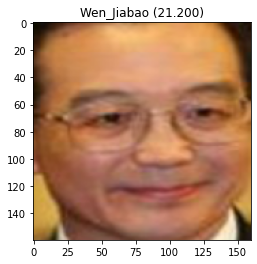

Predicted: Wen_Jiabao (7.213)
Expected: Wen_Jiabao


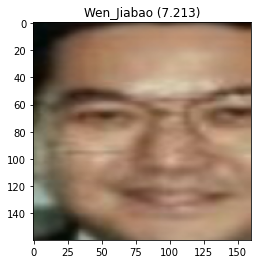

Predicted: Nicanor_Duarte_Frutos (10.950)
Expected: Nicanor_Duarte_Frutos


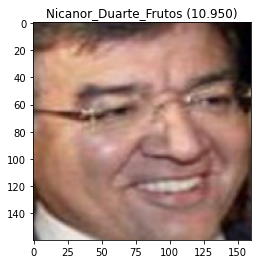

Predicted: Nicanor_Duarte_Frutos (11.646)
Expected: Nicanor_Duarte_Frutos


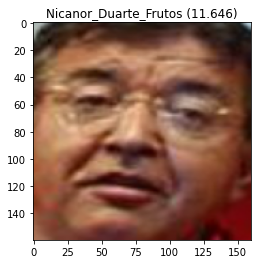

Predicted: Nicanor_Duarte_Frutos (14.644)
Expected: Nicanor_Duarte_Frutos


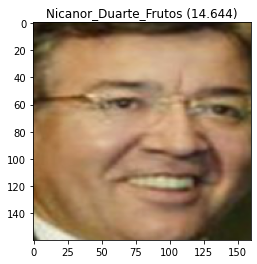

Predicted: David_Nalbandian (19.998)
Expected: David_Nalbandian


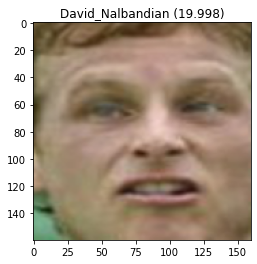

Predicted: David_Nalbandian (19.966)
Expected: David_Nalbandian


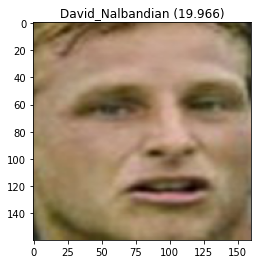

Predicted: David_Nalbandian (18.881)
Expected: David_Nalbandian


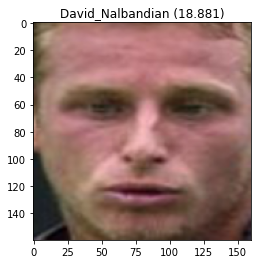

Predicted: Richard_Gephardt (15.574)
Expected: Richard_Gephardt


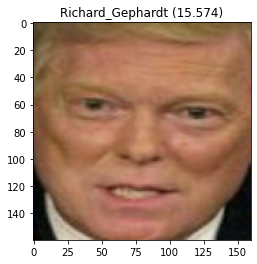

Predicted: Richard_Gephardt (11.755)
Expected: Richard_Gephardt


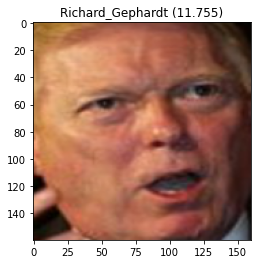

Predicted: Richard_Gephardt (13.271)
Expected: Richard_Gephardt


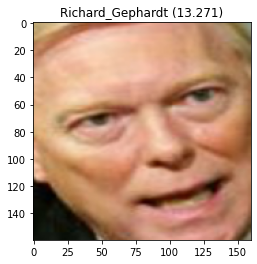

Predicted: Jackie_Chan (16.677)
Expected: Jackie_Chan


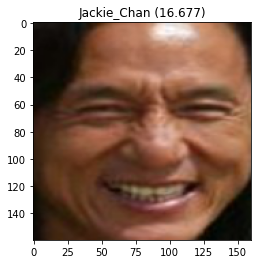

Predicted: Jackie_Chan (13.221)
Expected: Jackie_Chan


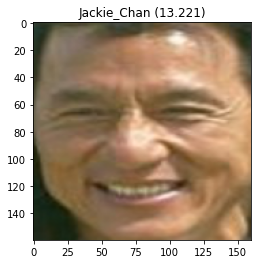

Predicted: Jackie_Chan (18.076)
Expected: Jackie_Chan


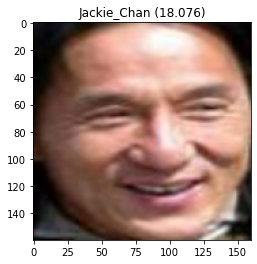

Predicted: Kim_Clijsters (18.638)
Expected: Kim_Clijsters


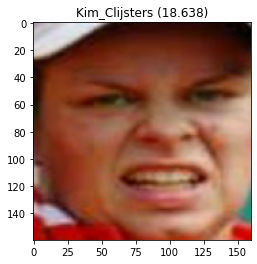

Predicted: Kim_Clijsters (14.806)
Expected: Kim_Clijsters


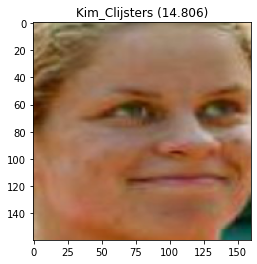

Predicted: Kim_Clijsters (16.537)
Expected: Kim_Clijsters


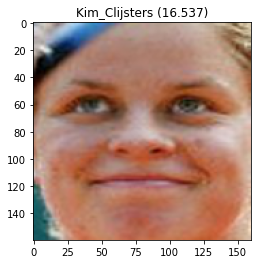

Predicted: Li_Peng (10.272)
Expected: Li_Peng


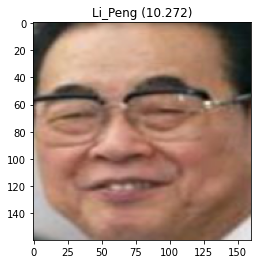

Predicted: Li_Peng (11.653)
Expected: Li_Peng


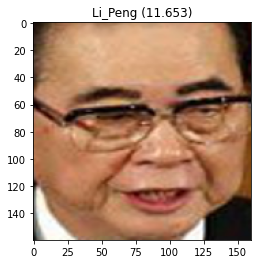

Predicted: Howard_Dean (12.418)
Expected: Howard_Dean


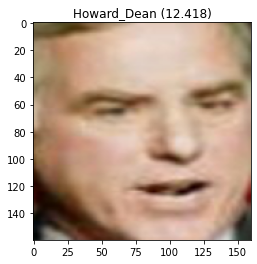

Predicted: Howard_Dean (14.743)
Expected: Howard_Dean


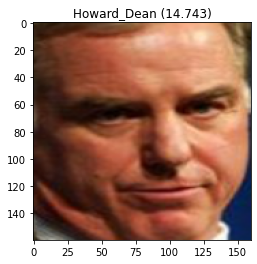

Predicted: Howard_Dean (15.836)
Expected: Howard_Dean


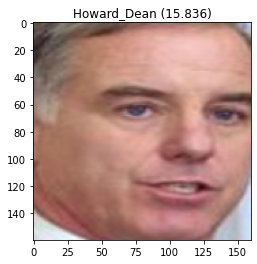

Predicted: Leonardo_DiCaprio (9.830)
Expected: Leonardo_DiCaprio


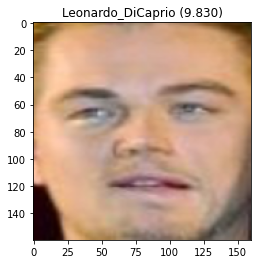

Predicted: Leonardo_DiCaprio (12.962)
Expected: Leonardo_DiCaprio


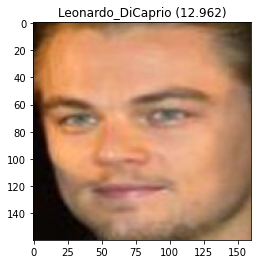

Predicted: Tom_Cruise (12.931)
Expected: Tom_Cruise


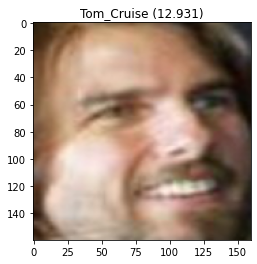

Predicted: Tom_Cruise (14.691)
Expected: Tom_Cruise


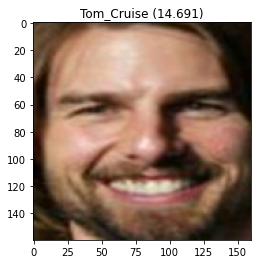

Predicted: Paul_Wolfowitz (12.319)
Expected: Paul_Wolfowitz


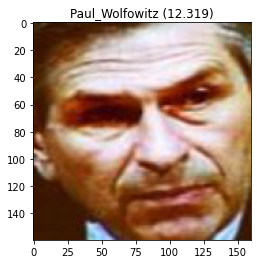

Predicted: Paul_Wolfowitz (17.689)
Expected: Paul_Wolfowitz


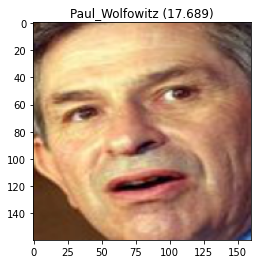

Predicted: Tung_Chee-hwa (10.860)
Expected: Tung_Chee-hwa


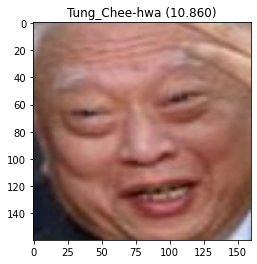

Predicted: Tung_Chee-hwa (13.936)
Expected: Tung_Chee-hwa


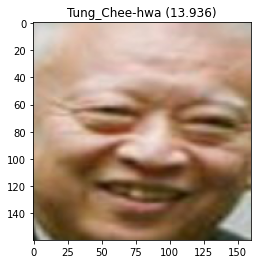

Predicted: Hillary_Clinton (16.415)
Expected: Hillary_Clinton


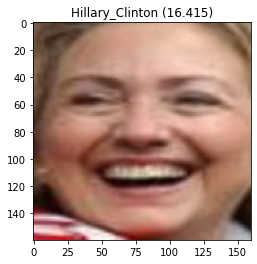

Predicted: Hillary_Clinton (16.354)
Expected: Hillary_Clinton


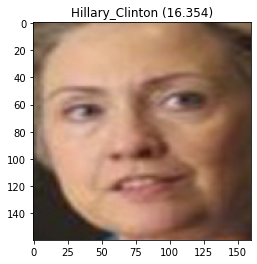

Predicted: Hillary_Clinton (21.669)
Expected: Hillary_Clinton


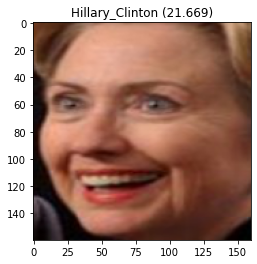

Predicted: Kim_Ryong-sung (14.500)
Expected: Kim_Ryong-sung


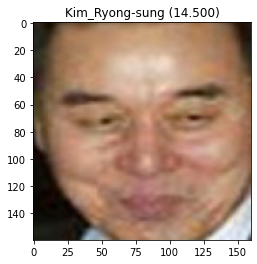

Predicted: Kim_Ryong-sung (14.004)
Expected: Kim_Ryong-sung


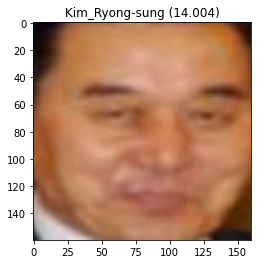

Predicted: Kim_Ryong-sung (11.007)
Expected: Kim_Ryong-sung


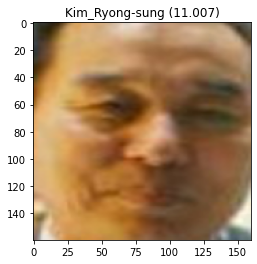

Predicted: Andy_Roddick (23.231)
Expected: Andy_Roddick


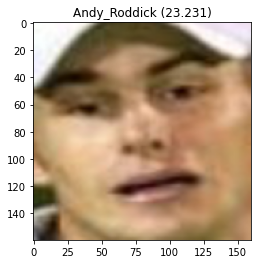

Predicted: Andy_Roddick (14.912)
Expected: Andy_Roddick


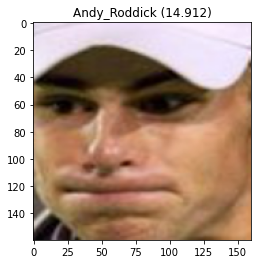

Predicted: Andy_Roddick (20.057)
Expected: Andy_Roddick


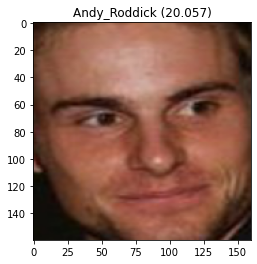

Predicted: Mahathir_Mohamad (9.861)
Expected: Mahathir_Mohamad


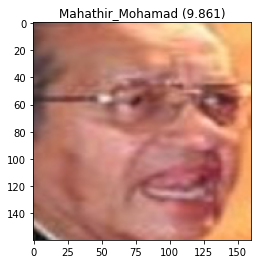

Predicted: Mahathir_Mohamad (14.185)
Expected: Mahathir_Mohamad


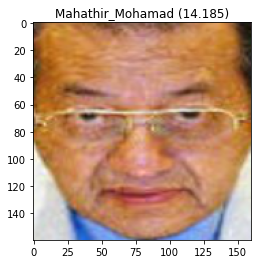

Predicted: Mahathir_Mohamad (21.160)
Expected: Mahathir_Mohamad


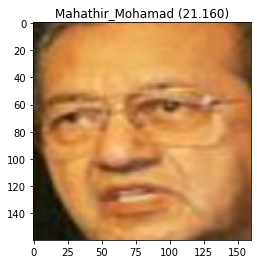

Predicted: Queen_Elizabeth_II (14.305)
Expected: Queen_Elizabeth_II


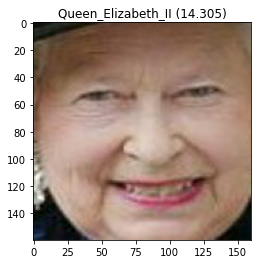

Predicted: Queen_Elizabeth_II (16.539)
Expected: Queen_Elizabeth_II


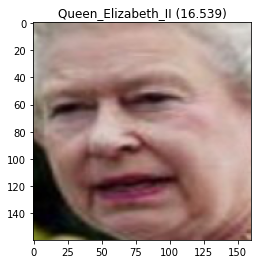

Predicted: Queen_Elizabeth_II (17.277)
Expected: Queen_Elizabeth_II


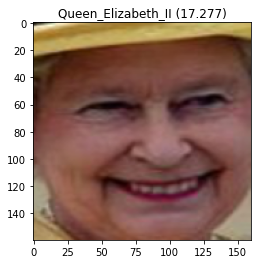

Predicted: Pierce_Brosnan (14.751)
Expected: Pierce_Brosnan


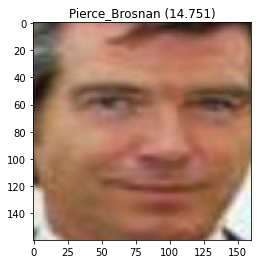

Predicted: Pierce_Brosnan (16.469)
Expected: Pierce_Brosnan


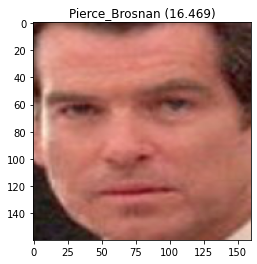

Predicted: Pierce_Brosnan (24.843)
Expected: Pierce_Brosnan


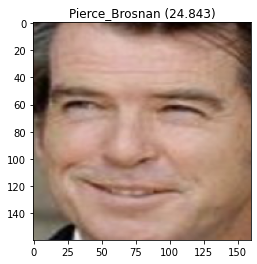

Predicted: Salma_Hayek (10.802)
Expected: Salma_Hayek


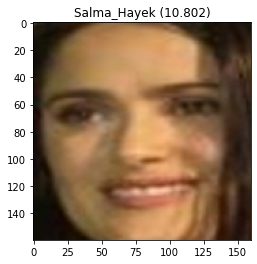

Predicted: Salma_Hayek (15.127)
Expected: Salma_Hayek


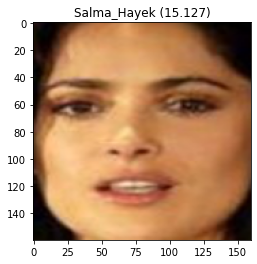

Predicted: Salma_Hayek (16.637)
Expected: Salma_Hayek


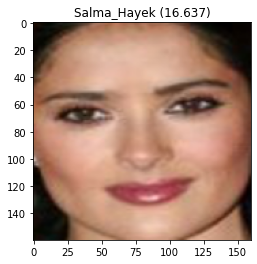

Predicted: Roger_Federer (19.560)
Expected: Roger_Federer


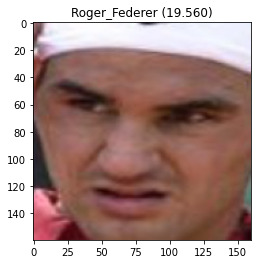

Predicted: Roger_Federer (10.381)
Expected: Roger_Federer


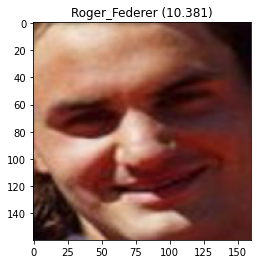

Predicted: Roger_Federer (14.870)
Expected: Roger_Federer


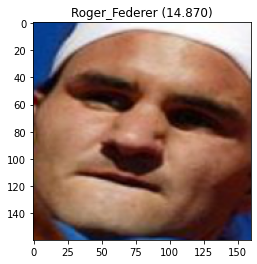

Predicted: Charles_Moose (10.528)
Expected: Charles_Moose


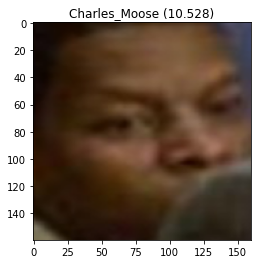

Predicted: Charles_Moose (16.156)
Expected: Charles_Moose


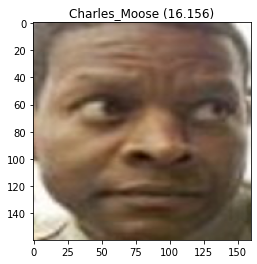

Predicted: Charles_Moose (18.034)
Expected: Charles_Moose


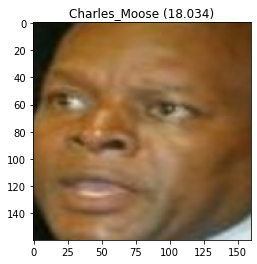

Predicted: Jeb_Bush (17.110)
Expected: Jeb_Bush


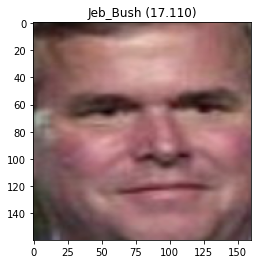

Predicted: Jeb_Bush (12.769)
Expected: Jeb_Bush


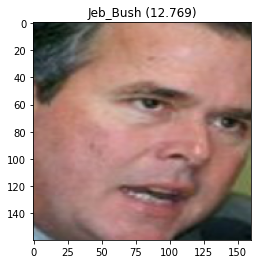

Predicted: Jeb_Bush (14.509)
Expected: Jeb_Bush


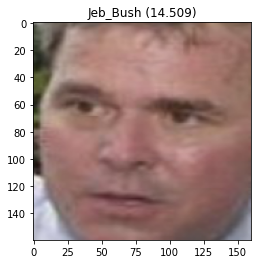

Predicted: Nancy_Pelosi (17.377)
Expected: Nancy_Pelosi


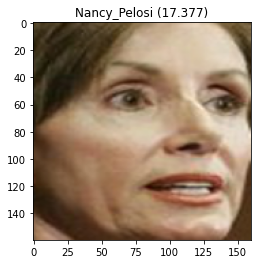

Predicted: Nancy_Pelosi (13.148)
Expected: Nancy_Pelosi


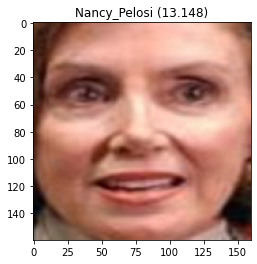

Predicted: Nancy_Pelosi (13.597)
Expected: Nancy_Pelosi


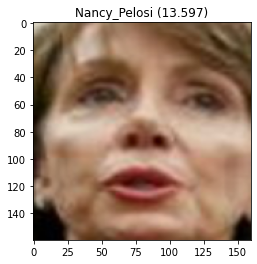

Predicted: Rubens_Barrichello (14.546)
Expected: Rubens_Barrichello


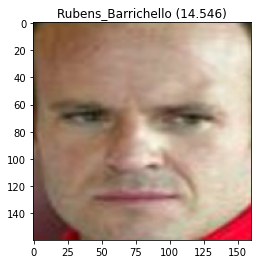

Predicted: Rubens_Barrichello (13.325)
Expected: Rubens_Barrichello


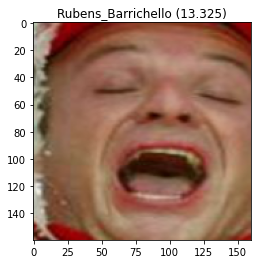

Predicted: Rubens_Barrichello (17.141)
Expected: Rubens_Barrichello


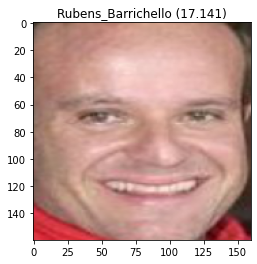

Predicted: Vaclav_Havel (12.402)
Expected: Vaclav_Havel


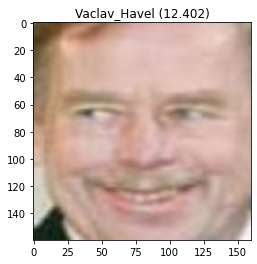

Predicted: Vaclav_Havel (12.686)
Expected: Vaclav_Havel


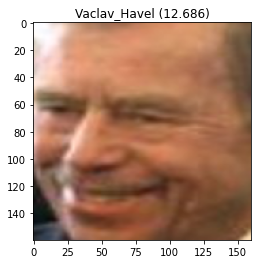

Predicted: Jeong_Se-hyun (13.720)
Expected: Jeong_Se-hyun


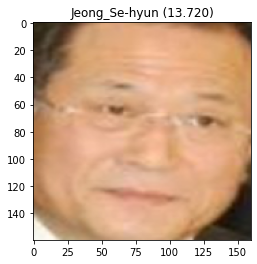

Predicted: Jeong_Se-hyun (12.877)
Expected: Jeong_Se-hyun


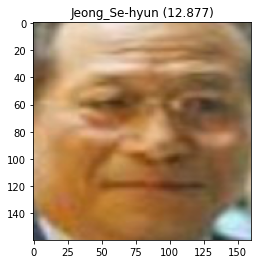

Predicted: Lucio_Gutierrez (6.117)
Expected: Lucio_Gutierrez


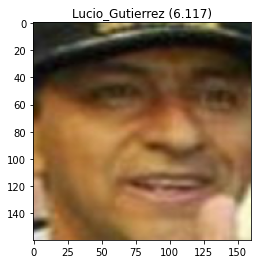

Predicted: Lucio_Gutierrez (13.081)
Expected: Lucio_Gutierrez


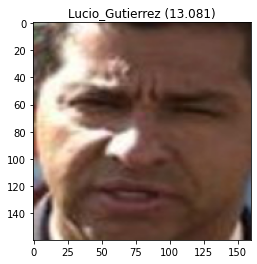

Predicted: Lucio_Gutierrez (16.840)
Expected: Lucio_Gutierrez


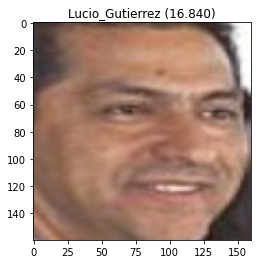

Predicted: Mohammed_Al-Douri (17.700)
Expected: Mohammed_Al-Douri


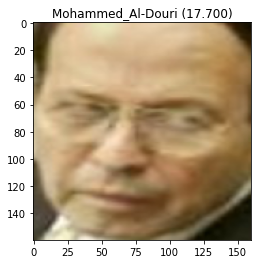

Predicted: Mohammed_Al-Douri (19.066)
Expected: Mohammed_Al-Douri


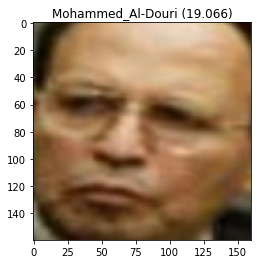

Predicted: Mohammed_Al-Douri (24.117)
Expected: Mohammed_Al-Douri


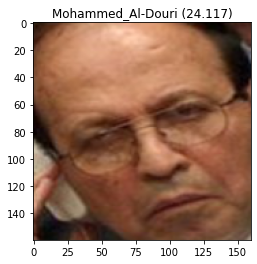

Predicted: Hu_Jintao (21.808)
Expected: Hu_Jintao


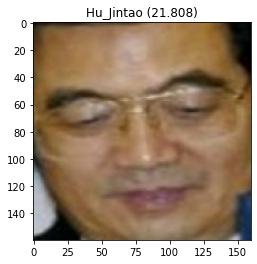

Predicted: Hu_Jintao (21.213)
Expected: Hu_Jintao


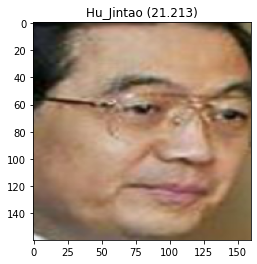

Predicted: Hu_Jintao (20.266)
Expected: Hu_Jintao


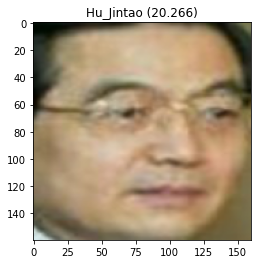

Predicted: Eduardo_Duhalde (26.432)
Expected: Eduardo_Duhalde


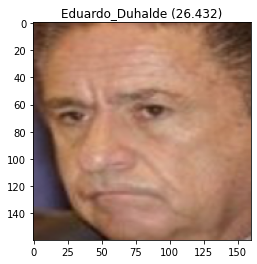

Predicted: Eduardo_Duhalde (26.432)
Expected: Eduardo_Duhalde


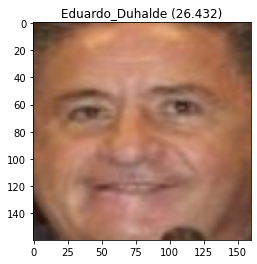

Predicted: Eduardo_Duhalde (27.032)
Expected: Eduardo_Duhalde


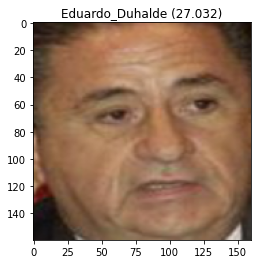

Predicted: Andy_Roddick (4.016)
Expected: Hugh_Grant


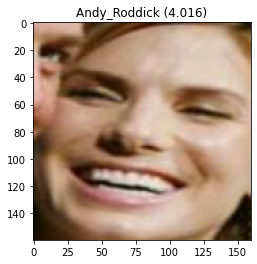

Predicted: Hugh_Grant (8.591)
Expected: Hugh_Grant


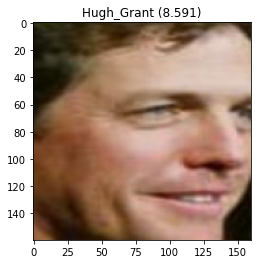

Predicted: Thomas_OBrien (8.816)
Expected: Thomas_OBrien


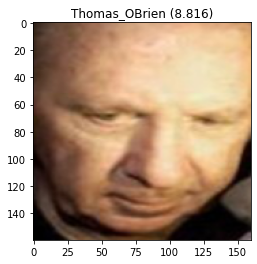

Predicted: Thomas_OBrien (11.715)
Expected: Thomas_OBrien


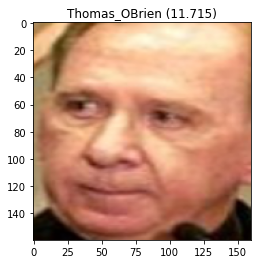

Predicted: Muhammad_Ali (15.895)
Expected: Muhammad_Ali


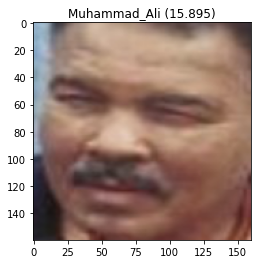

Predicted: Muhammad_Ali (13.418)
Expected: Muhammad_Ali


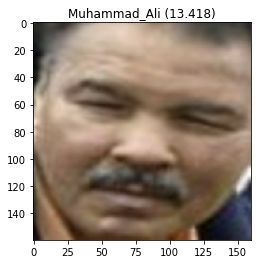

Predicted: Catherine_Zeta-Jones (6.415)
Expected: Catherine_Zeta-Jones


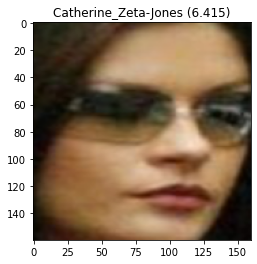

Predicted: Catherine_Zeta-Jones (15.427)
Expected: Catherine_Zeta-Jones


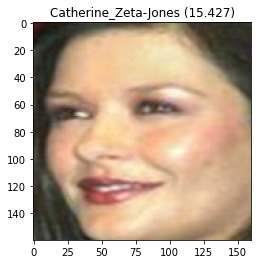

Predicted: Catherine_Zeta-Jones (16.605)
Expected: Catherine_Zeta-Jones


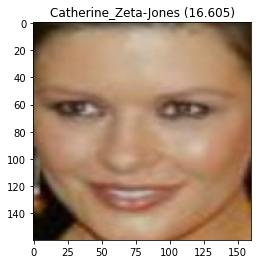

Predicted: Dick_Cheney (15.084)
Expected: Dick_Cheney


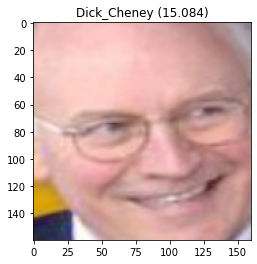

Predicted: Dick_Cheney (16.376)
Expected: Dick_Cheney


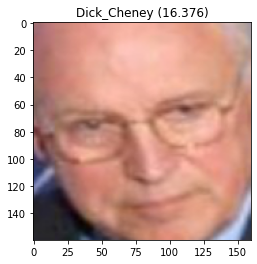

Predicted: Dick_Cheney (20.207)
Expected: Dick_Cheney


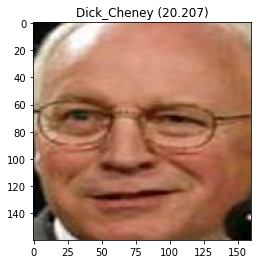

Predicted: Jean-David_Levitte (14.838)
Expected: Jean-David_Levitte


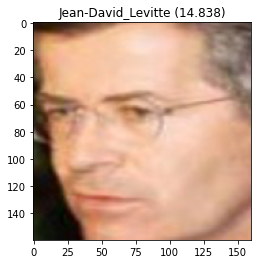

Predicted: Jean-David_Levitte (16.575)
Expected: Jean-David_Levitte


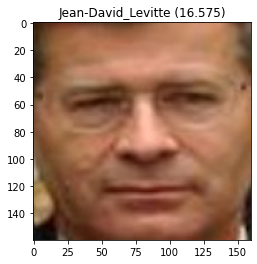

Predicted: Fernando_Gonzalez (9.349)
Expected: Fernando_Gonzalez


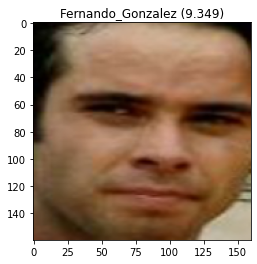

Predicted: Fernando_Gonzalez (13.741)
Expected: Fernando_Gonzalez


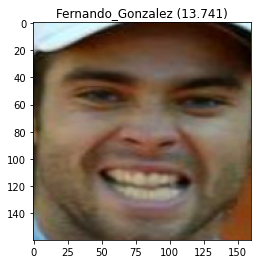

Predicted: Jennifer_Garner (10.589)
Expected: Jennifer_Garner


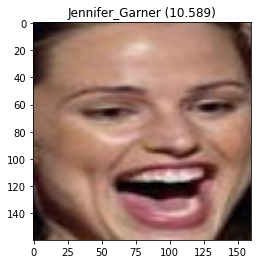

Predicted: Jennifer_Garner (16.335)
Expected: Jennifer_Garner


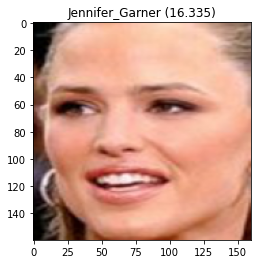

Predicted: Jennifer_Garner (14.808)
Expected: Jennifer_Garner


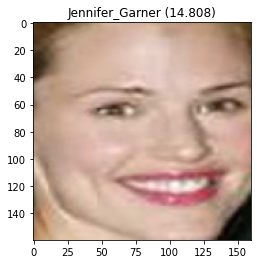

Predicted: Mohammad_Khatami (10.052)
Expected: Mohammad_Khatami


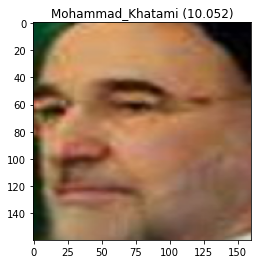

Predicted: Mohammad_Khatami (17.988)
Expected: Mohammad_Khatami


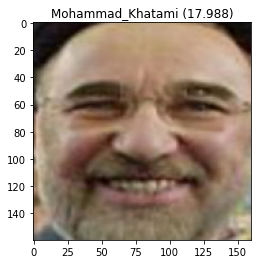

Predicted: Meryl_Streep (23.133)
Expected: Meryl_Streep


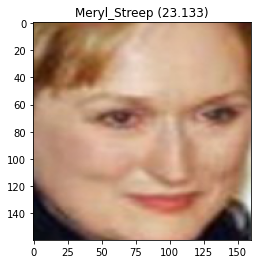

Predicted: Meryl_Streep (23.828)
Expected: Meryl_Streep


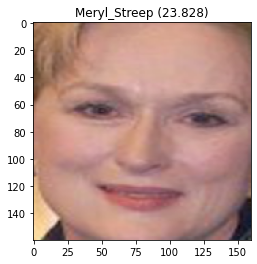

Predicted: Meryl_Streep (12.931)
Expected: Meryl_Streep


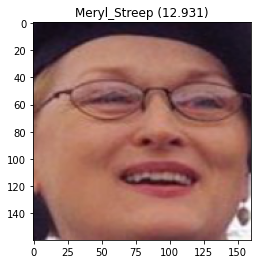

Predicted: George_Clooney (11.508)
Expected: George_Clooney


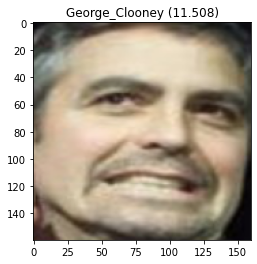

Predicted: George_Clooney (14.737)
Expected: George_Clooney


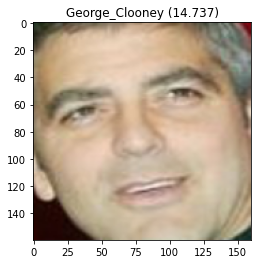

Predicted: Bill_Gates (19.752)
Expected: Bill_Gates


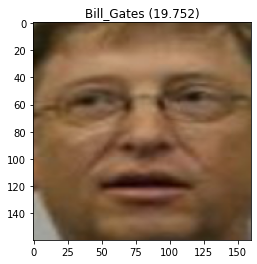

Predicted: Bill_Gates (18.234)
Expected: Bill_Gates


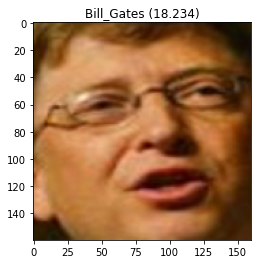

Predicted: Bill_Gates (18.266)
Expected: Bill_Gates


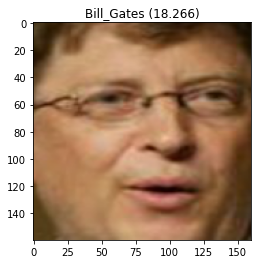

Predicted: Bill_Gates (24.442)
Expected: Bill_Gates


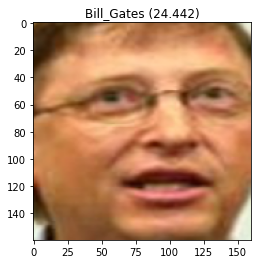

Predicted: Kate_Hudson (11.699)
Expected: Kate_Hudson


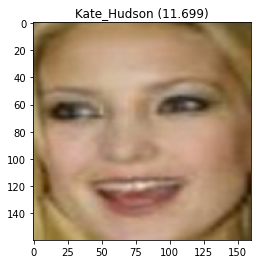

Predicted: Kate_Hudson (14.145)
Expected: Kate_Hudson


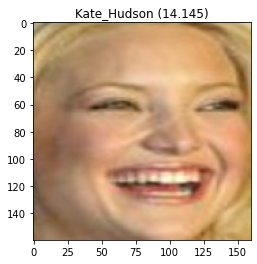

Predicted: Jimmy_Carter (14.370)
Expected: Jimmy_Carter


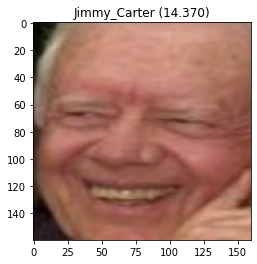

Predicted: Jimmy_Carter (17.064)
Expected: Jimmy_Carter


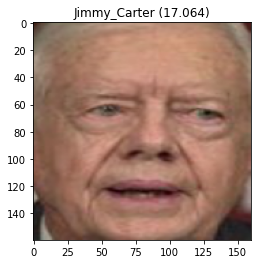

Predicted: Ray_Romano (9.478)
Expected: Ray_Romano


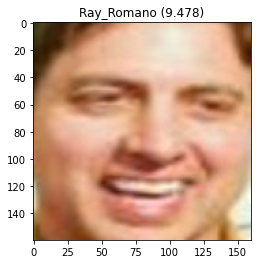

Predicted: Ray_Romano (10.439)
Expected: Ray_Romano


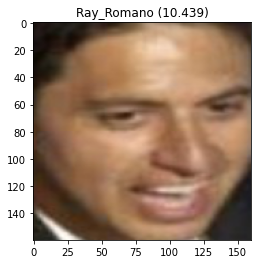

Predicted: Keanu_Reeves (16.534)
Expected: Keanu_Reeves


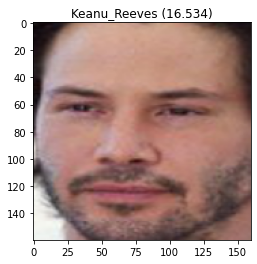

Predicted: Keanu_Reeves (19.826)
Expected: Keanu_Reeves


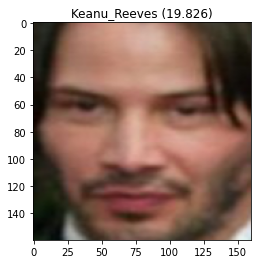

Predicted: Keanu_Reeves (14.027)
Expected: Keanu_Reeves


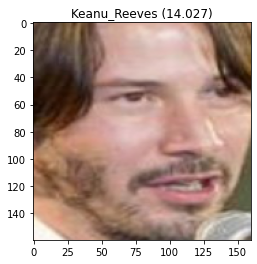

In [130]:
#Define True Positive (TP) and False Positive (FP)
TP = []
FP = []

#Store predicted classes and probabilities
prediction = []
probabilities = []
classes = []

# Predict every face in the test set and compare with the expected label
for i in range(len(testX_faces)):
    face_pixels = testX_faces[i]
    face_emb = testX[i]
    face_class = testy[i]
    face_name = out_encoder.inverse_transform([testy[i]])
    
    # prediction for the face
    #sample = expand_dims(testX[i], axis=0)
    sample = face_emb.reshape(1, 128)
    yhat_class = model.predict(sample)
    prediction.append(yhat_class)
    yhat_prob = model.predict_proba(sample)
    probabilities.append(yhat_prob)
    
    #Compare with expected label
    if yhat_class == face_class:
        TP.append(i)
    else:
        FP.append(i)
        
     # get name
    all_class_index = yhat_class[0]
    all_class_probability = yhat_prob[0,all_class_index] * 100
    predict_all_names = out_encoder.inverse_transform(yhat_class)
    classes.append(predict_all_names)
    print('Predicted: %s (%.3f)' % (predict_all_names[0], all_class_probability))
    print('Expected: %s' % face_name[0])

    # plot for fun
    pyplot.imshow(face_pixels)
    title_2 = '%s (%.3f)' % (predict_all_names[0], all_class_probability)
    pyplot.title(title_2)
    pyplot.show()
    
with open('labels2_lfw.txt', 'wb') as fp:
    pickle.dump(prediction, fp)

System accuracy
Correctly classify: 99.43%
Incorrectly classify: 0.57%


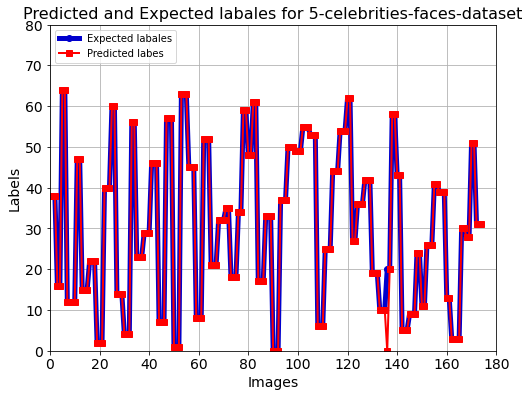

In [95]:
#Metrics
TP_perc = (len(TP)/len(testX_faces))*100
FP_perc = (len(FP)/len(testX_faces))*100
X = float(TP_perc)
Y = float(FP_perc)
TPR  = round(X, 2)
FPR  = round(Y, 2)

print('System accuracy')
print('Correctly classify: %s' % (TPR) + '%')
print('Incorrectly classify: %s' % (FPR) + '%') 

#Plotting labels
f, ax1 = plt.subplots(1, 1, sharex=True, figsize=(8, 6))

ax1.plot(testy, color="mediumblue", linestyle="-", marker="o", linewidth=5, label="Expected labales")
ax1.plot(prediction, color="r", linestyle="-", marker="s", linewidth=2, label="Predicted labes")

ax1.set_title('Predicted and Expected labales for 5-celebrities-faces-dataset', fontsize=16, fontweight='normal')
# ax1.spines['top'].set_visible(False)
# ax1.spines['right'].set_visible(False)
plt.legend(loc='upper left')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('Images', fontsize=14)
plt.ylabel('Labels', fontsize=14)
plt.xlim(0, 180)
plt.ylim(0, 80)
plt.grid(b=None, which='major', axis='both')
plt.savefig('predicted vs. expected-LFW.png')
plt.show()

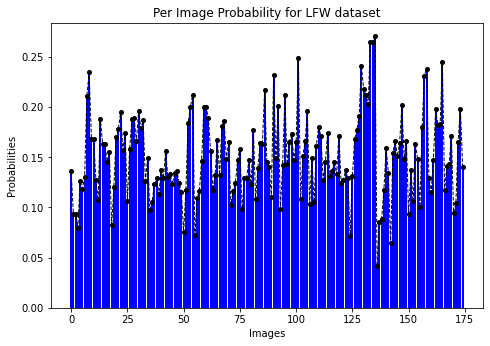

In [5]:
prob = []
for i in probabilities:
    prob.append(max(max(i)))

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111)

labels = []
for i in range(len(prob)):
    if testy[i] != testy[i-1]:
        labels.append(classes[i])
        
ax.set_xlabel("Images")
ax.set_ylabel('Probabilities')
ax.set_title("Per Image Probability for LFW dataset")

colors = np.random.rand(len(labels),3)

for i in range(len(prob)):
    ax.bar(i, prob[i], color='b')
#plt.xticks(range(len(prob)), range(len(prob)), fontsize=5, rotation=0)
ax.plot(range(len(prob)), prob[0:], color='black', marker='o', linestyle='dashed', linewidth = 1, markersize = 4)
fig.tight_layout(pad=5) 

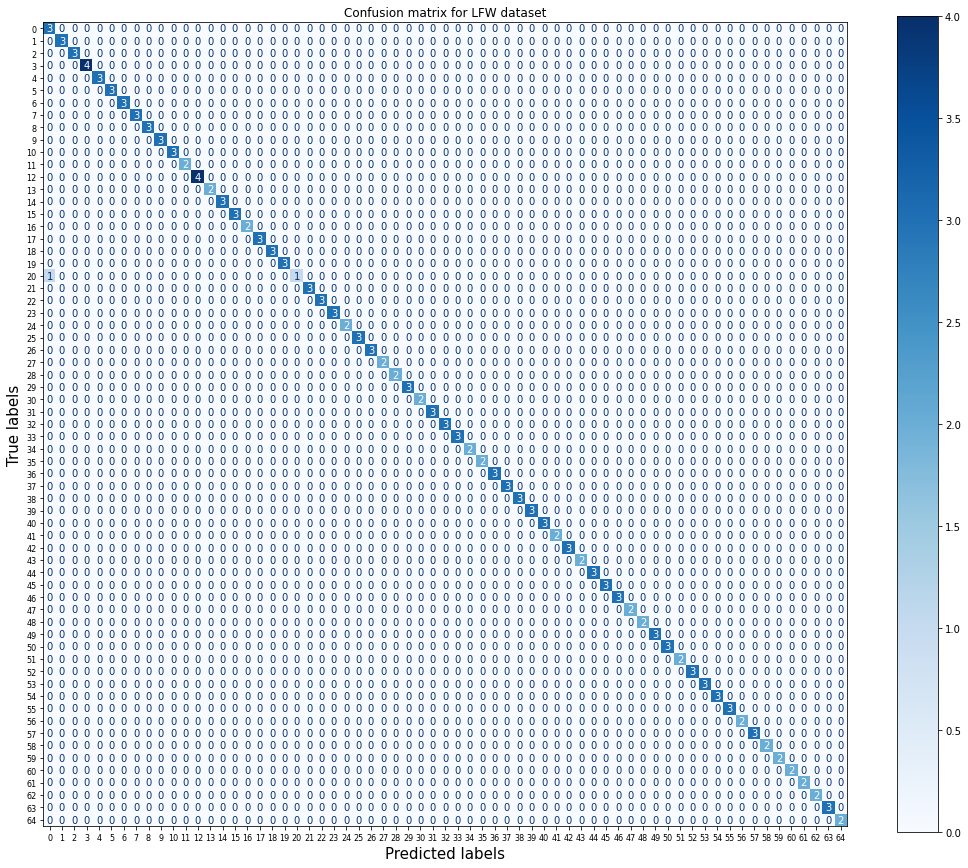

In [6]:
from sklearn.metrics import confusion_matrix, plot_confusion_matrix

fig = plt.figure(figsize=(18, 15))
ax = fig.add_subplot(111)
C = plot_confusion_matrix(model, testX, testy, xticks_rotation = 0, cmap=plt.cm.Blues, ax = ax)
                  
C.ax_.set_title("Confusion matrix for LFW dataset")
ax.tick_params(axis='both', which='major', labelsize=8)
plt.xlabel('Predicted labels', fontsize = 15)
plt.ylabel('True labels', fontsize = 15)
    #print(title)
   # print(C.confusion_matrix)

plt.show()

In [126]:
# Write labels in txt file for future inference
import pickle

with open('labels_lfw.txt', 'wb') as fp:
    pickle.dump(labels, fp)
    
with open('labels_lfw.txt', 'wb') as fp:
    pickle.dump(labels, fp)

In [ ]:
# Write labels in txt file for future inference
list1 = []
for i in range(len(prediction)):
    if int(prediction[i]) != int(prediction[i-1]):
        list1.append(int(prediction[i]))
        
import pickle

with open ('labels2_lfw.txt', 'rb') as fp:
    itemlist2 = pickle.load(fp)
    
newlist = []
newlist2 = []

with open ('labels2_lfw.txt', 'rb') as fp:
    itemlist2 = pickle.load(fp)
    
with open ('labels2_lfw.txt', 'rb') as fp:
    itemlist2 = pickle.load(fp)
    
for i in range(len(prediction)):
    if prediction[i][0] != prediction[i-1][0]
        newlist.append(prediction[i][0])

In [142]:
with open ('labels2_lfw.txt', 'rb') as fp:
    itemlist2 = pickle.load(fp)
    
newlist = []

for i in range(len(itemlist2)):
    if itemlist2[i] != itemlist2[i-1]:
        newlist.append(itemlist2)
new    

In [143]:
for i in range(len(prediction)):
    if prediction[i][0] != prediction[i-1][0]
        newlist.append(prediction[i][0])
newlist

[38,
 16,
 64,
 12,
 47,
 15,
 22,
 2,
 40,
 60,
 14,
 4,
 56,
 23,
 29,
 46,
 7,
 57,
 1,
 63,
 45,
 8,
 52,
 21,
 32,
 35,
 18,
 34,
 59,
 48,
 61,
 17,
 33,
 0,
 37,
 50,
 49,
 55,
 53,
 6,
 25,
 44,
 54,
 62,
 27,
 36,
 42,
 19,
 10,
 0,
 20,
 58,
 43,
 5,
 9,
 24,
 11,
 26,
 41,
 39,
 13,
 3,
 30,
 28,
 51,
 31]

In [187]:
# Write labels in txt file for future inference
newlist = []
newlist2= []
newlist3 = []

for i in range(len(prediction)):
    if prediction[i][0] != prediction[i-1][0]:
        newlist.append(prediction[i][0])
        
for i in range(len(newlist)):
    a = np.asarray(newlist[i])
    b = expand_dims(a, axis=0)
    #print(b.shape)
    c = out_encoder.inverse_transform(b)
    newlist2.append(c)

for i in range(len(newlist2)):
    newlist3.append(newlist2[i][0])

# Save to txt 
with open('labels_lfw_ok.txt', 'wb') as fp:
    pickle.dump(newlist3, fp)

with open('labels_code_ok.txt', 'wb') as fp:
    pickle.dump(newlist, fp)
    
# Check if they were properly saved
with open ('labels_lfw_ok.txt', 'rb') as fp:
    itemlist2 = pickle.load(fp)

with open ('labels_code_ok.txt', 'rb') as fp:
    itemlist3 = pickle.load(fp)

for i in range(len(newlist)):
    print(itemlist2[i])
    print(itemlist3[i])

Mark_Philippoussis
38
Heizo_Takenaka
16
Zhu_Rongji
64
Fidel_Castro
12
Paul_ONeill
47
Harrison_Ford
15
James_Blake
22
Ari_Fleischer
2
Michael_Jackson
40
Tom_Hanks
60
George_HW_Bush
14
Britney_Spears
4
Sylvester_Stallone
56
James_Kelly
23
John_Allen_Muhammad
29
Norah_Jones
46
Condoleezza_Rice
7
Tang_Jiaxuan
57
Anna_Kournikova
1
Wen_Jiabao
63
Nicanor_Duarte_Frutos
45
David_Nalbandian
8
Richard_Gephardt
52
Jackie_Chan
21
Kim_Clijsters
32
Li_Peng
35
Howard_Dean
18
Leonardo_DiCaprio
34
Tom_Cruise
59
Paul_Wolfowitz
48
Tung_Chee-hwa
61
Hillary_Clinton
17
Kim_Ryong-sung
33
Andy_Roddick
0
Mahathir_Mohamad
37
Queen_Elizabeth_II
50
Pierce_Brosnan
49
Salma_Hayek
55
Roger_Federer
53
Charles_Moose
6
Jeb_Bush
25
Nancy_Pelosi
44
Rubens_Barrichello
54
Vaclav_Havel
62
Jeong_Se-hyun
27
Lucio_Gutierrez
36
Mohammed_Al-Douri
42
Hu_Jintao
19
Eduardo_Duhalde
10
Andy_Roddick
0
Hugh_Grant
20
Thomas_OBrien
58
Muhammad_Ali
43
Catherine_Zeta-Jones
5
Dick_Cheney
9
Jean-David_Levitte
24
Fernando_Gonzalez
11
Jennifer_